# Hybrid Images & Image Enhancement


### Part I: Hybrid Images

In [1]:
import cv2
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
%matplotlib inline

In [2]:
def hybridImage(im1, im2, cutoff_low, cutoff_high):
    '''
    Inputs:
        im1:    RGB (height x width x 3) or a grayscale (height x width) image
                as a numpy array.
        im2:    RGB (height x width x 3) or a grayscale (height x width) image
                as a numpy array.
        cutoff_low: standard deviation for the low-pass filter
        cutoff_high: standard deviation for the high-pass filter
        
    Output:
        Return the combination of both images, one filtered with a low-pass filter
        and the other with a high-pass filter.
        '''

    # Create low-pass filtered image
    low_pass = cv2.GaussianBlur(im1,
                                (59, 59),
                                cutoff_low,
                                cv2.BORDER_REFLECT)
    
    # Create high-pass filtered image
    high_pass = 0.5 + (im2 - cv2.GaussianBlur(im2,
                                              (59, 59),
                                              cutoff_high,
                                              cv2.BORDER_REFLECT))
 
    # Show individual images before they are added
    # (for demonstration purposes only)    
    fig, axes = plt.subplots(1,2, figsize = (20,20))
    axes[0].imshow((low_pass*255.0).astype('uint8'), cmap='gray')
    axes[0].set_title('low-pass filtered image')
    axes[1].imshow((high_pass*255.0).astype('uint8'), cmap='gray')
    axes[1].set_title('high-pass filtered image')
    plt.show()
    
    # Create and Show Gaussian Pyramid of the low-pass image
    low_pass_p = low_pass.copy()
    fig, axes = plt.subplots(1,6, figsize = (20,20))
    for i in range(6):
        low_pass_p = cv2.pyrDown(low_pass_p)
        axes[i].imshow((low_pass_p*255.0).astype('uint8'), cmap='gray')
    plt.show()

    # Create and Show Gaussian Pyramid of the low-pass image
    high_pass_p = high_pass.copy()
    fig, axes = plt.subplots(1,6, figsize = (20,20))
    for i in range(6):
        high_pass_p = cv2.pyrDown(high_pass_p)
        axes[i].imshow((high_pass_p*255.0).astype('uint8'), cmap='gray')
    plt.show()

    
    # Merge images
    im_hybrid_result = cv2.accumulate(low_pass, high_pass)/2
    
    # Create and Show Gaussian Pyramid of the hybrid image
    hybrid_p = im_hybrid_result.copy()
    fig, axes = plt.subplots(1,6, figsize = (20,20))
    for i in range(6):
        hybrid_p = cv2.pyrDown(hybrid_p)
        axes[i].imshow((hybrid_p*255.0).astype('uint8'), cmap='gray')
    plt.show()

    
    # Convert to integers for 0-255 scale
    im_hybrid_result = (im_hybrid_result*255.0).astype('uint8')   
    
    # Clip values greater than 255 for 0-255 scale
    im_hybrid_result[im_hybrid_result > 255] = 255
    
    return im_hybrid_result


#### 1st Trial: "Are you a tiger or a kitten?" -- Success

##### Image selection
I thought it would be amusing to see a tiger from a distance and then a kitten as you got closer, so I picked two images that I thought might work together.

##### Image alignment
I just aligned them based on the position of their eyes.

##### Results
I think the results are good. Up close you can see from the eyes that it is a kitten, but at a distance the outline of a tiger (with creepy eyes) takes over, which is in the spirit of the hybrid images we're creating.


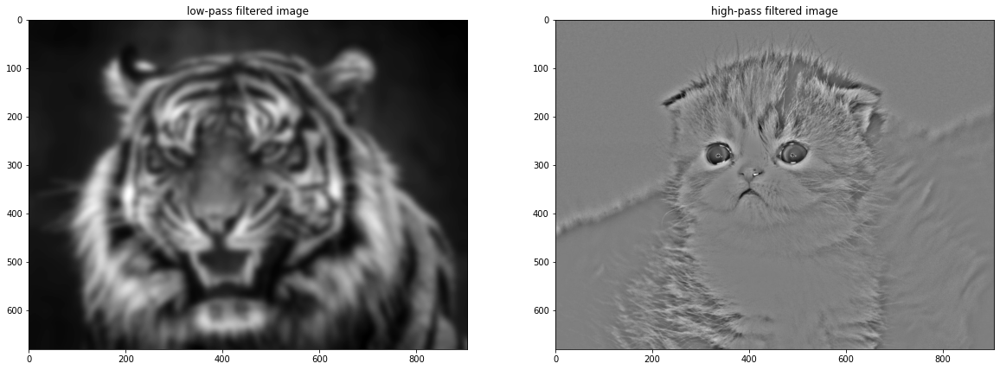

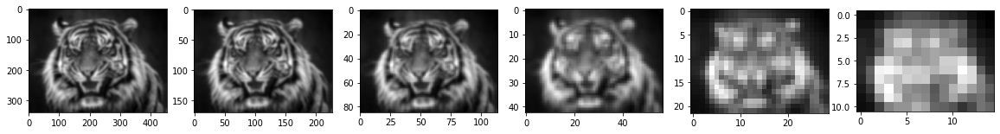

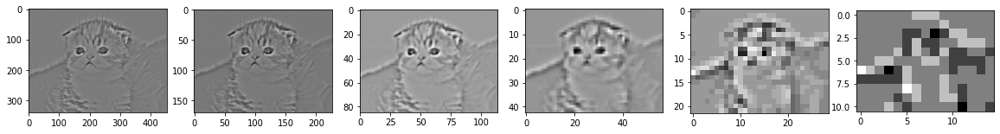

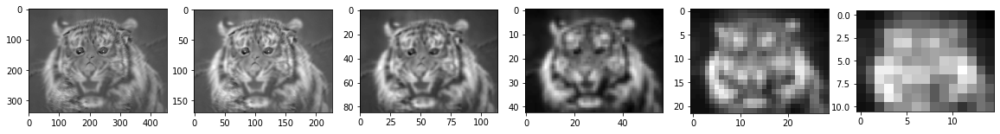

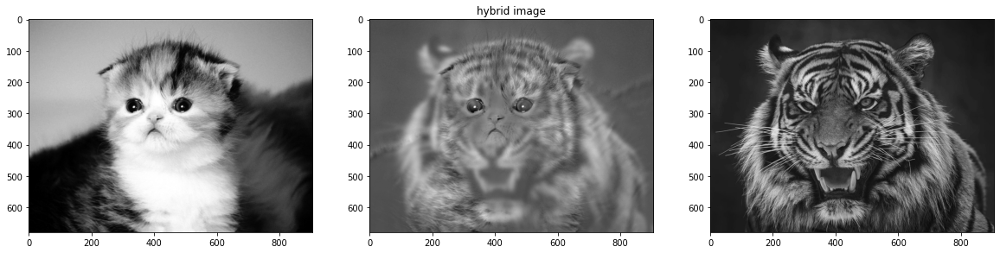

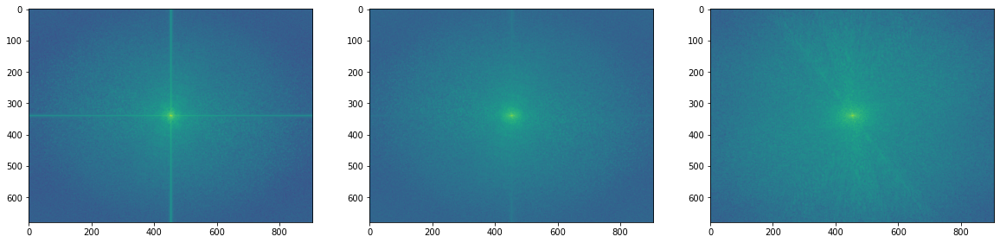

In [3]:
# Import the 1st image
image1a_filename = './images/im1a.jpg'
image1a = cv2.imread(image1a_filename)
im1a = cv2.cvtColor(image1a, cv2.COLOR_BGR2GRAY) / 255.0



# Import the 2nd image
image1b_filename = './images/im1b.jpg'
image1b = cv2.imread(image1b_filename)
im1b = cv2.cvtColor(image1b, cv2.COLOR_BGR2GRAY) / 255.0

# Create the Hybrid Image
im1_hybrid = hybridImage(im1b, im1a, 6, 10)

# Save the results to a file
cv2.imwrite('./results/hybrid_1_grayscale.jpg',
            im1_hybrid,
            [int(cv2.IMWRITE_JPEG_QUALITY), 100])


# Plot the results next to the original images
fig, axes = plt.subplots(1,3, figsize = (20,20))
axes[0].imshow(im1a, cmap='gray')
axes[1].imshow(im1_hybrid, cmap='gray')
axes[1].set_title('hybrid image')
axes[2].imshow(im1b, cmap='gray')
plt.show()


# Create 2D Fast Fourier Transforms
im1a_fft = np.log(np.abs(np.fft.fftshift(np.fft.fft2(im1a))))
im1b_fft = np.log(np.abs(np.fft.fftshift(np.fft.fft2(im1b))))
im1_hybrid_fft = np.log(np.abs(np.fft.fftshift(np.fft.fft2(im1_hybrid))))

# Plot the Fourier Transforms under the corresponding images
fig, axes = plt.subplots(1,3, figsize = (20,20))
axes[0].imshow(im1a_fft)
axes[1].imshow(im1_hybrid_fft)
axes[2].imshow(im1b_fft)
plt.show()


#### 2nd Trial: "Is it Sarah Hyland or Mila Kunis?" -- Success

##### Image selection
I did a Google search for celebrities that look alike and discovered people think Sarah Hyland looks like Mila Kunis. I wanted to see how similar they really were to each other...

##### Image alignment
I aligned them based on their eyes, but I wasn't getting good results, beacuse their eyebrows were way off. By flipping the image of Sarah Hyland horizontally and cropping I was able to better align their eyes.

##### Results
To be honest, I think the result is amazing. I'm just not sure if I see both of them or either of them up close or far away. Since they look so alike, merging their pictures together gives an interesting result, but doesn't really demonstrate the hybrid image properties very well. For that reason, this is my second favorite hybrid image, just because of the mental dexterity required while viewing it next to the original images.

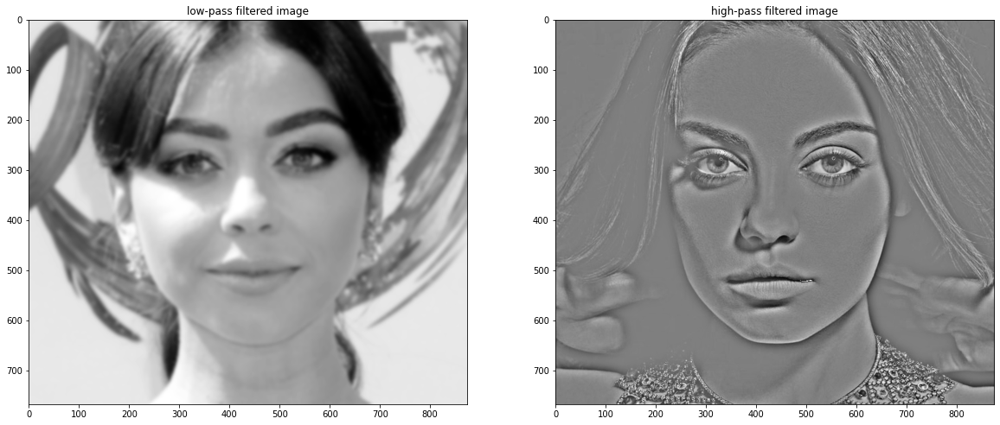

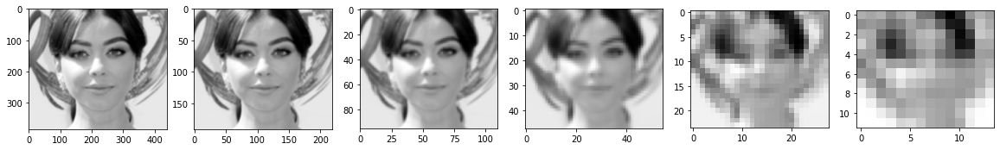

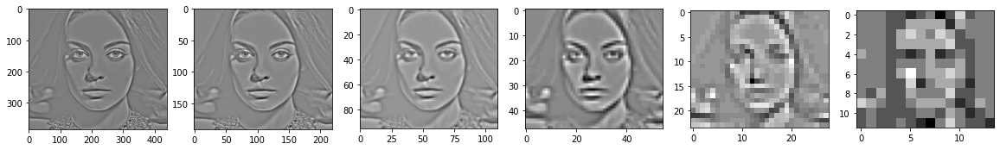

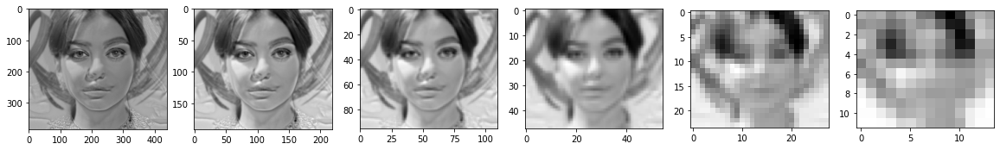

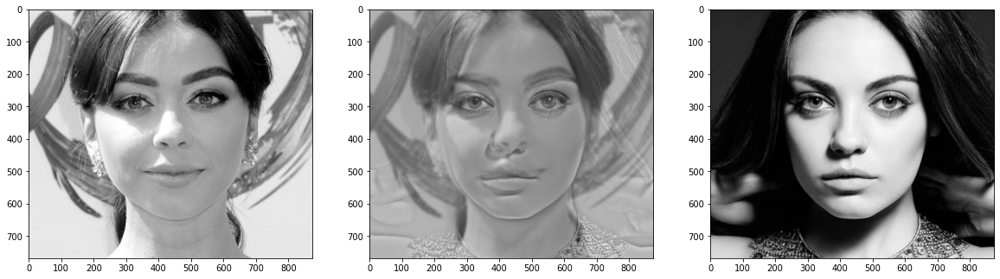

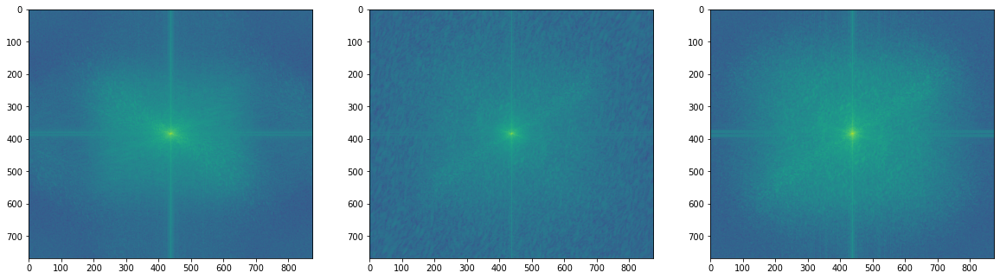

In [4]:
# Import the 1st image
image2a_filename = './images/im2a.jpg'
image2a = cv2.imread(image2a_filename)
im2a = cv2.cvtColor(image2a, cv2.COLOR_BGR2GRAY) / 255.0

# Import the 2nd image
image2b_filename = './images/im2b.jpg'
image2b = cv2.imread(image2b_filename)
im2b = cv2.cvtColor(image2b, cv2.COLOR_BGR2GRAY) / 255.0

# Create the Hybrid Image
im2_hybrid = hybridImage(im2a, im2b, 3, 10)

# Save the results to a file
cv2.imwrite('./results/hybrid_2_grayscale.jpg',
            im2_hybrid,
            [int(cv2.IMWRITE_JPEG_QUALITY), 100])


# Plot the results next to the original images
fig, axes = plt.subplots(1,3, figsize = (20,20))
axes[0].imshow(im2a, cmap='gray')
axes[1].imshow(im2_hybrid, cmap='gray')
axes[2].imshow(im2b, cmap='gray')
plt.show()


# Create 2D Fast Fourier Transforms
im2a_fft = np.log(np.abs(np.fft.fftshift(np.fft.fft2(im2a))))
im2b_fft = np.log(np.abs(np.fft.fftshift(np.fft.fft2(im2b))))
im2_hybrid_fft = np.log(np.abs(np.fft.fftshift(np.fft.fft2(im2_hybrid))))

# Plot the Fourier Transforms under the corresponding images
fig, axes = plt.subplots(1,3, figsize = (20,20))
axes[0].imshow(im2a_fft)
axes[1].imshow(im2_hybrid_fft)
axes[2].imshow(im2b_fft)
plt.show()


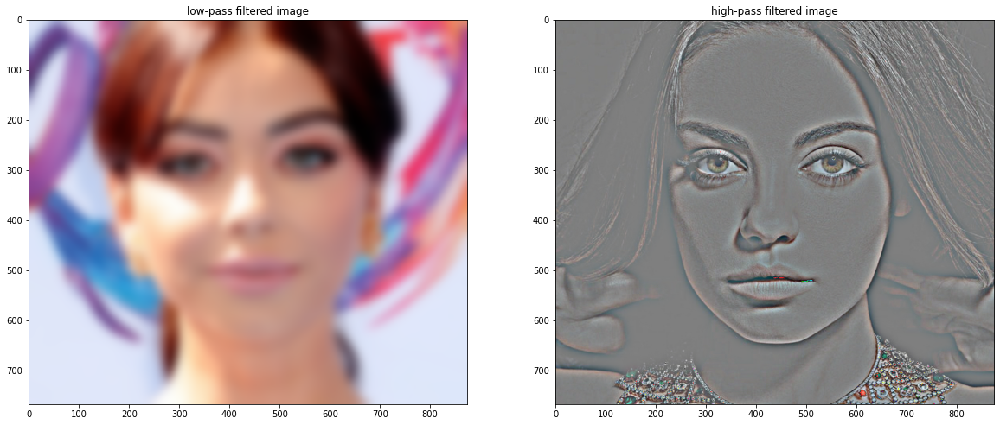

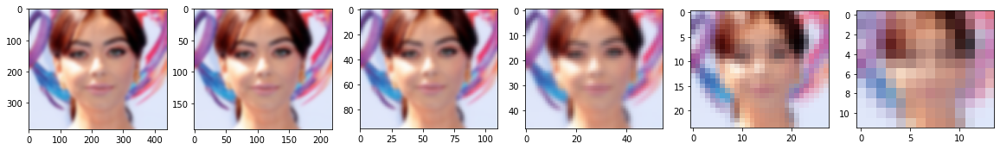

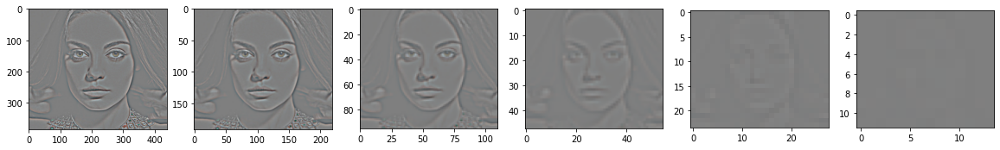

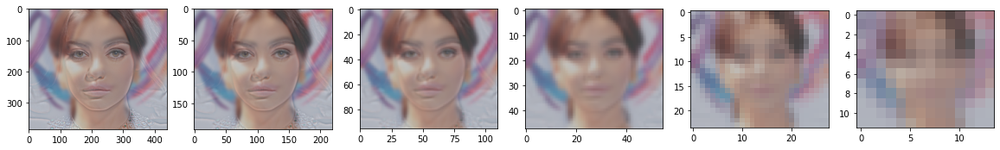

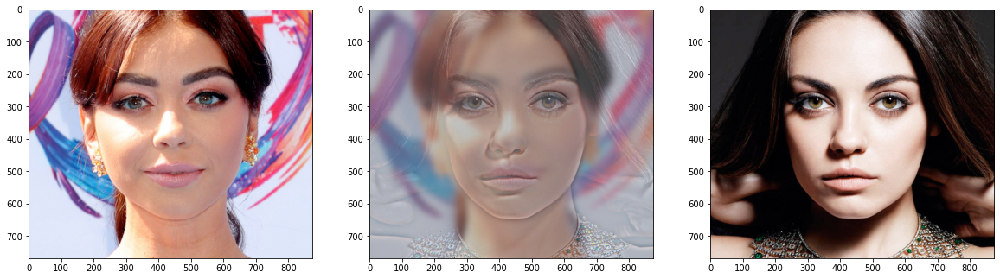

In [5]:
im2a_rgb = cv2.cvtColor(image2a, cv2.COLOR_BGR2RGB)/255.0
im2b_rgb = cv2.cvtColor(image2b, cv2.COLOR_BGR2RGB)/255.0

im2_rgb_hybrid = hybridImage(im2a_rgb, im2b_rgb, 10, 8)

# Save the results to a file
cv2.imwrite('./results/hybrid_2_color.jpg',
            cv2.cvtColor(im2_rgb_hybrid, cv2.COLOR_RGB2BGR),
            [int(cv2.IMWRITE_JPEG_QUALITY), 100])


fig, axes = plt.subplots(1,3, figsize = (20,20))
axes[0].imshow(im2a_rgb)
axes[1].imshow(im2_rgb_hybrid)
axes[2].imshow(im2b_rgb)
plt.show()


#### 3rd Trial: "Motorcycle & BMX Bike" -- Failure?

##### Image selection
I thought it would be fun to see a motorcycle from a distance, but as you approached it was not only a bike, but a kid's BMX bike.

##### Image alignment
I aligned the images based on their hubs.

##### Results
I didn't find the results to be very impressive

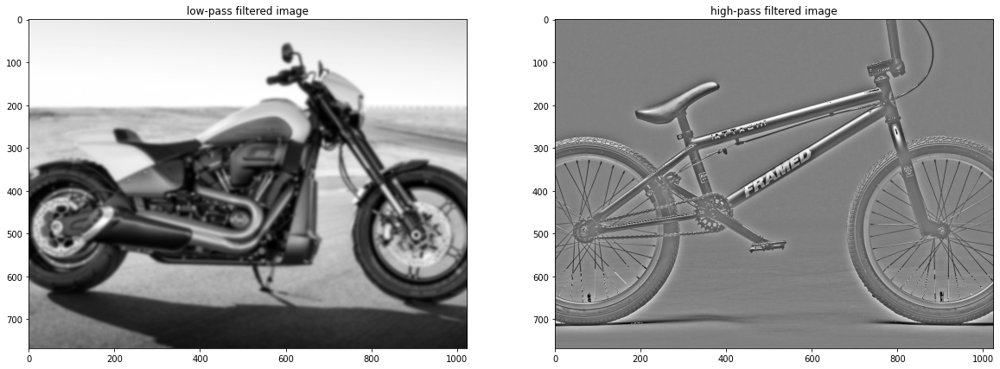

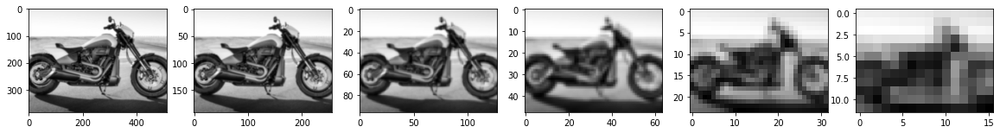

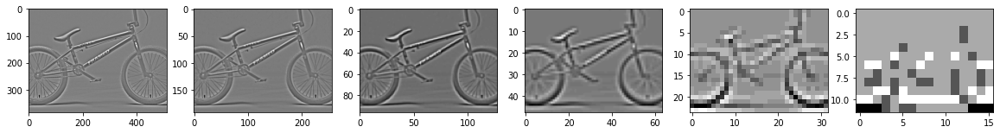

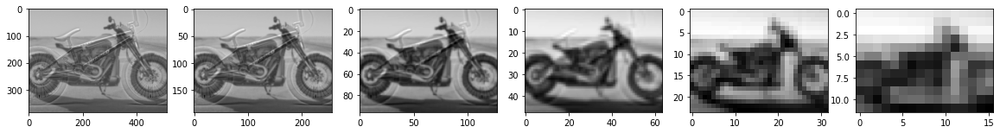

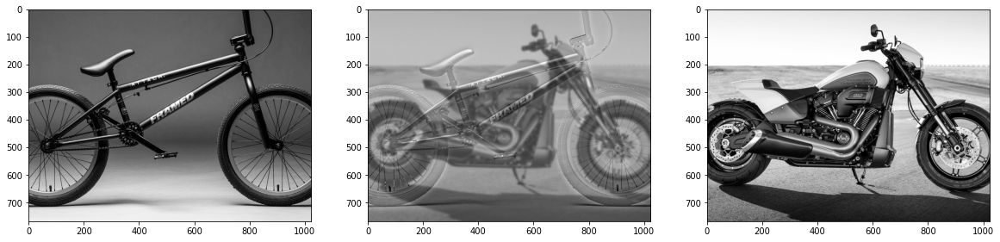

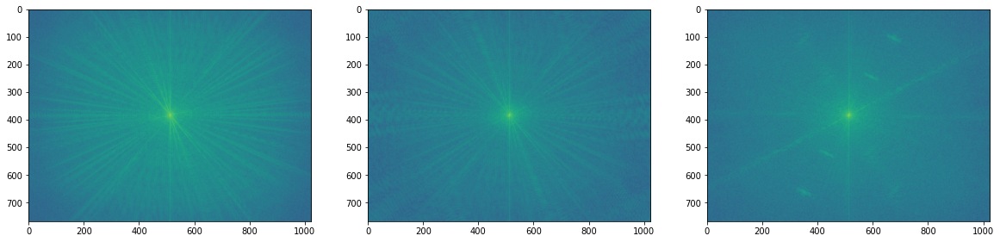

In [6]:
# 3rd Trial: Failure
# Mechanical objects seem to be visually defined
# by their high-frequency elements

# Import the 1st image
image3a_filename = './images/im3a.jpg'
image3a = cv2.imread(image3a_filename)
im3a = cv2.cvtColor(image3a, cv2.COLOR_BGR2GRAY) / 255.0

# Import the 2nd image
image3b_filename = './images/im3b.jpg'
image3b = cv2.imread(image3b_filename)
im3b = cv2.cvtColor(image3b, cv2.COLOR_BGR2GRAY) / 255.0

# Create the Hybrid Image
im3_hybrid = hybridImage(im3b, im3a, 3, 10)

# Save the results to a file
cv2.imwrite('./results/hybrid_3_grayscale.jpg',
            im3_hybrid,
            [int(cv2.IMWRITE_JPEG_QUALITY), 100])


# Plot the results next to the original images
fig, axes = plt.subplots(1,3, figsize = (20,20))
axes[0].imshow(im3a, cmap='gray')
axes[1].imshow(im3_hybrid, cmap='gray')
axes[2].imshow(im3b, cmap='gray')
plt.show()


# Create 2D Fast Fourier Transforms
im3a_fft = np.log(np.abs(np.fft.fftshift(np.fft.fft2(im3a))))
im3b_fft = np.log(np.abs(np.fft.fftshift(np.fft.fft2(im3b))))
im3_hybrid_fft = np.log(np.abs(np.fft.fftshift(np.fft.fft2(im3_hybrid))))

# Plot the Fourier Transforms under the corresponding images
fig, axes = plt.subplots(1,3, figsize = (20,20))
axes[0].imshow(im3a_fft)
axes[1].imshow(im3_hybrid_fft)
axes[2].imshow(im3b_fft)
plt.show()


### Part II: Image Enhancement
Two out of three types of image enhancement are required. Choose a good image to showcase each type and implement a method. This code doesn't rely on the hybrid image part.

#### Contrast enhancement
##### Image selection
I reasoned that a snowy or foggy scene would lack good contrast, but that trees, branches or other hard textures would pop out of the scene if the contrast was enhanced.

##### Image manipulation
I realized that RGB wasn't a good color space to use to enhance the contrast of an image so I looked for other formats I could use. I settled on LAB, a format where I could manipulate a single channel to get good results.

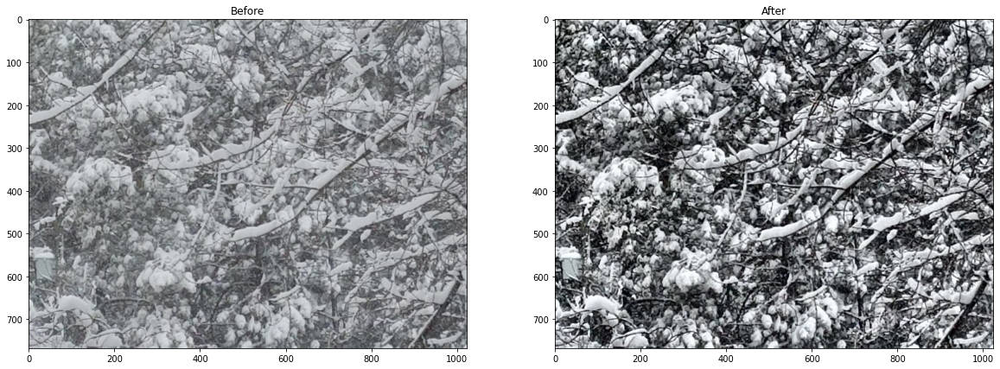

In [7]:
# Open an image with low contrast
contrast_img = cv2.imread('./images/low_contrast.jpg')

# Convert to LAB color space
lab = cv2.cvtColor(contrast_img, cv2.COLOR_BGR2LAB)

# Split the channels out of the LAB image
lightness, color_channel_a, color_channel_b = cv2.split(lab)

# Create a Contrast Limited AHE with default values
clahe = cv2.createCLAHE()

# Apply it only only to the "Lightness" channel
enlightenment = clahe.apply(lightness)

# Create a new LAB image with enhanced L and original A & B channels
enlightened_lab = cv2.merge((enlightenment,
                             color_channel_a,
                             color_channel_b))

# Save the results to a file
cv2.imwrite('./results/contrast_enhancement.jpg',
            cv2.cvtColor(enlightened_lab, cv2.COLOR_LAB2BGR),
            [int(cv2.IMWRITE_JPEG_QUALITY), 100])


# Convert the LAB image to the RGB color space
enlightened_img = cv2.cvtColor(enlightened_lab, cv2.COLOR_LAB2RGB)

# Convert the original imagine to the RGB color space
contrast_img = cv2.cvtColor(contrast_img, cv2.COLOR_BGR2RGB)

# Plot the result
fig, axes = plt.subplots(1,2, figsize = (20,20))
axes[0].set_title('Before')
axes[0].imshow(contrast_img)
axes[1].set_title('After')
axes[1].imshow(enlightened_img)
plt.show()


#### Color enhancement

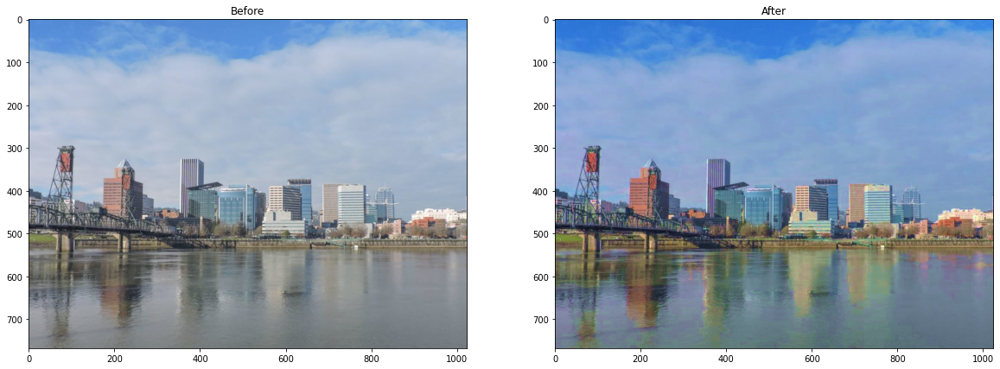

In [8]:
# Open an image that could use more color
color_img = cv2.imread('./images/low_color.jpg')

# Convert to HSV color space
hsv = cv2.cvtColor(color_img, cv2.COLOR_BGR2HSV)

# Split the channels out of the HSV image
hue, saturation, value = cv2.split(hsv)

# Find a useful value to increase saturation
max_current = max(saturation.flatten())
max_increase = 255 - max_current

# Only increase saturation by a certain amount
increase_factor = 0.65
increase_by = int(increase_factor*max_increase)

# Increase the saturation levels
saturated = saturation + increase_by

# Create a new HSV image with increased S and H & V channels
saturated_hsv = cv2.merge((hue, saturated, value))

# Save the results to a file
cv2.imwrite('./results/color_enhancement.jpg',
            cv2.cvtColor(saturated_hsv, cv2.COLOR_HSV2BGR),
            [int(cv2.IMWRITE_JPEG_QUALITY), 100])


# Convert the HSV image to the RGB color space
saturated_img = cv2.cvtColor(saturated_hsv, cv2.COLOR_HSV2RGB)

# Convert the original imagine to the RGB color space
color_img = cv2.cvtColor(color_img, cv2.COLOR_BGR2RGB)

# Plot the result
fig, axes = plt.subplots(1,2, figsize = (20,20))
axes[0].set_title('Before')
axes[0].imshow(color_img)
axes[1].set_title('After')
axes[1].imshow(saturated_img)
plt.show()


#### Color shift


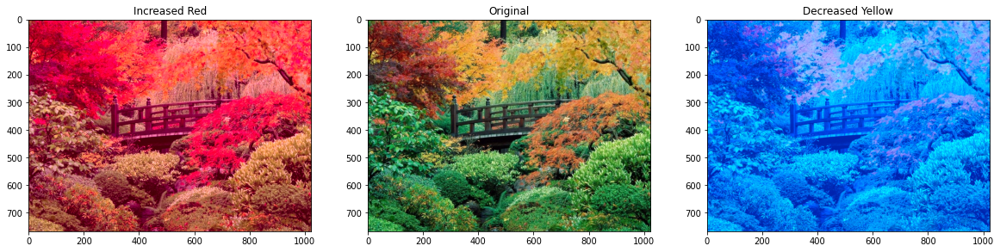

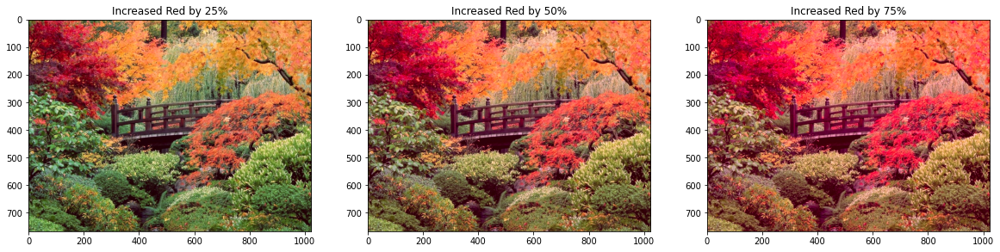

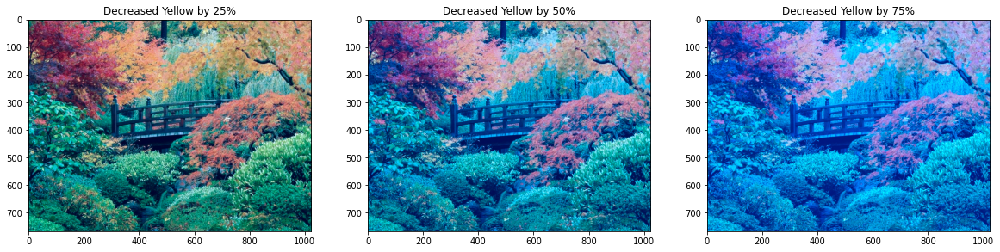

In [9]:
# Open an image that could benefit from a color shift
shift_img = cv2.imread('./images/color_shift.jpg')

# Convert to LAB
lab = cv2.cvtColor(shift_img, cv2.COLOR_BGR2LAB)
lightness, color_channel_a, color_channel_b = cv2.split(lab)


# The A-channel is used for Green and Magenta
# Increasing by some maximum value to see the results:
increased_red = color_channel_a + (255 - max(color_channel_a.flatten()))

# The B-channel is used for Yellow and Blue
# Decreasing by some maximum value to see the results:
less_yellow = color_channel_b - min(color_channel_b.flatten())

# Create LAB images from the modified arrays
red_lab = cv2.merge((lightness, increased_red, color_channel_b))
yellow_lab = cv2.merge((lightness, color_channel_a, less_yellow))

# Save the results to files
cv2.imwrite('./results/color_shift_red_max.jpg',
            cv2.cvtColor(red_lab, cv2.COLOR_LAB2BGR),
            [int(cv2.IMWRITE_JPEG_QUALITY), 100])
cv2.imwrite('./results/color_shift_yellow_max.jpg',
            cv2.cvtColor(yellow_lab, cv2.COLOR_LAB2BGR),
            [int(cv2.IMWRITE_JPEG_QUALITY), 100])


# Convert everything to RGB to display
rgb = cv2.cvtColor(shift_img, cv2.COLOR_BGR2RGB)
red = cv2.cvtColor(red_lab, cv2.COLOR_LAB2RGB)
yel = cv2.cvtColor(yellow_lab, cv2.COLOR_LAB2RGB)


# Plot the result
fig, axes = plt.subplots(1,3, figsize = (20,20))
axes[0].set_title('Increased Red')
axes[0].imshow(red)
axes[1].set_title('Original')
axes[1].imshow(rgb)
axes[2].set_title('Decreased Yellow')
axes[2].imshow(yel)
plt.show()


# Increasing by different amounts of Red
increased_red_1 = color_channel_a + int(0.25*(255 - max(color_channel_a.flatten())))
increased_red_2 = color_channel_a + int(0.50*(255 - max(color_channel_a.flatten())))
increased_red_3 = color_channel_a + int(0.75*(255 - max(color_channel_a.flatten())))

# Converting everything to LAB
red_lab_1 = cv2.merge((lightness, increased_red_1, color_channel_b))
red_lab_2 = cv2.merge((lightness, increased_red_2, color_channel_b))
red_lab_3 = cv2.merge((lightness, increased_red_3, color_channel_b))

# Save the results to files
cv2.imwrite('./results/color_shift_red_25.jpg',
            cv2.cvtColor(red_lab_1, cv2.COLOR_LAB2BGR),
            [int(cv2.IMWRITE_JPEG_QUALITY), 100])
cv2.imwrite('./results/color_shift_red_50.jpg',
            cv2.cvtColor(red_lab_2, cv2.COLOR_LAB2BGR),
            [int(cv2.IMWRITE_JPEG_QUALITY), 100])
cv2.imwrite('./results/color_shift_red_75.jpg',
            cv2.cvtColor(red_lab_3, cv2.COLOR_LAB2BGR),
            [int(cv2.IMWRITE_JPEG_QUALITY), 100])




# Displaying everything as RGB
fig, axes = plt.subplots(1,3, figsize = (20,20))
axes[0].set_title('Increased Red by 25%')
axes[0].imshow(cv2.cvtColor(red_lab_1, cv2.COLOR_LAB2RGB))
axes[1].set_title('Increased Red by 50%')
axes[1].imshow(cv2.cvtColor(red_lab_2, cv2.COLOR_LAB2RGB))
axes[2].set_title('Increased Red by 75%')
axes[2].imshow(cv2.cvtColor(red_lab_3, cv2.COLOR_LAB2RGB))
plt.show()



# Decreasing by different amounts of Yellow
less_yellow_1 = color_channel_b - int(0.25*min(color_channel_b.flatten()))
less_yellow_2 = color_channel_b - int(0.50*min(color_channel_b.flatten()))
less_yellow_3 = color_channel_b - int(0.75*min(color_channel_b.flatten()))

# Converting everything to LAB
yel_lab_1 = cv2.merge((lightness, color_channel_a, less_yellow_1))
yel_lab_2 = cv2.merge((lightness, color_channel_a, less_yellow_2))
yel_lab_3 = cv2.merge((lightness, color_channel_a, less_yellow_3))

# Save the results to files
cv2.imwrite('./results/color_shift_yellow_25.jpg',
            cv2.cvtColor(yel_lab_1, cv2.COLOR_LAB2BGR),
            [int(cv2.IMWRITE_JPEG_QUALITY), 100])
cv2.imwrite('./results/color_shift_yellow_50.jpg',
            cv2.cvtColor(yel_lab_2, cv2.COLOR_LAB2BGR),
            [int(cv2.IMWRITE_JPEG_QUALITY), 100])
cv2.imwrite('./results/color_shift_yellow_75.jpg',
            cv2.cvtColor(yel_lab_3, cv2.COLOR_LAB2BGR),
            [int(cv2.IMWRITE_JPEG_QUALITY), 100])


# Displaying everything as RGB
fig, axes = plt.subplots(1,3, figsize = (20,20))
axes[0].set_title('Decreased Yellow by 25%')
axes[0].imshow(cv2.cvtColor(yel_lab_1, cv2.COLOR_LAB2RGB))
axes[1].set_title('Decreased Yellow by 50%')
axes[1].imshow(cv2.cvtColor(yel_lab_2, cv2.COLOR_LAB2RGB))
axes[2].set_title('Decreased Yellow by 75%')
axes[2].imshow(cv2.cvtColor(yel_lab_3, cv2.COLOR_LAB2RGB))
plt.show()


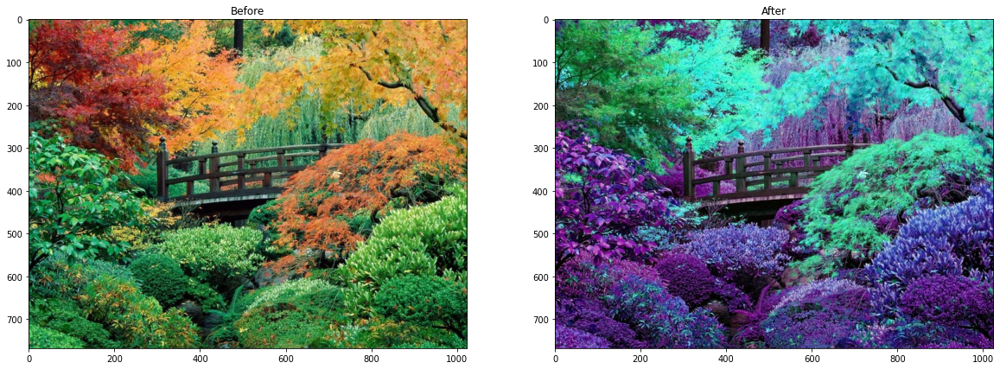

In [10]:
# Testing Shifting colors by Hue channel in HSV

# Convert to HSV color space
hsv = cv2.cvtColor(shift_img, cv2.COLOR_BGR2HSV)

# Split the channels out of the HSV image
hue, saturation, value = cv2.split(hsv)

# Find a useful value to shift the hue
max_current = max(hue.flatten())
max_increase = 255 - max_current
shift_factor = 0.90
shift_by = int(shift_factor*max_increase)

# Change the hue
shifted_hues = hue + shift_by

# Create a new HSV image with shifted H and original S & V channels
shifted_hue_hsv = cv2.merge((shifted_hues, saturation, value))

# Convert the HSV image to the RGB color space
shifted_hue_img = cv2.cvtColor(shifted_hue_hsv, cv2.COLOR_HSV2RGB)

# Convert the original imagine to the RGB color space
shift_img = cv2.cvtColor(shift_img, cv2.COLOR_BGR2RGB)

# Plot the result
fig, axes = plt.subplots(1,2, figsize = (20,20))
axes[0].set_title('Before')
axes[0].imshow(shift_img)
axes[1].set_title('After')
axes[1].imshow(shifted_hue_img)


plt.show()